# Unit 2 Portfolio Project
## Predictive Modeling with Spotify Data
Ryan Fikejs - *Data Science, Lambda School DS 26*

### Build Week Day 3 (v2.2.0)

*Fix Linear Model*


*Eliminate id column*



*Use Shapley Force Plot*



*Finish visualizations in Communicate results section*



Notes:

• Made a 300GB page file on my m.2 drive to see if I
could keep the id column and still one hot encode for
my logistic regression model (no good)

• Was very grateful for classification report to help with metrics

• Dropped the idea of using ROC curves since it gets way more

complicated with multiclass classification

• Didn't get to using LogisticRegressionCV as I'd hoped

• One can see also in my wrangle function that I was working on

a way to eliminate observations that didn't have an accurate release

date (default month day == 1), but didn't get time to finish that.

• Wish I had more time to tune, that part is fun!

### Build Week Day 2 (v2.1.0)

*Make a linear model for comparison.*


*Engineer an 'age' feature, or test with 'realease_date' back intact*



*Do some more hyper parameter tuning*



*Process oridnally encode artists id column such that Shaply force plot will work*



Notes:

•  When using the logistic regression with such a large dataset

and (presumably so many unique values in the artists_id feature),

the machine runs out of memory for a very large array. Will have to

find work around. The sinmplest would be to eliminate the id column...

• 

### Build Week Day 1 (v2.0)

*Use Pandas Profiling to get a bigger picture of what we're dealing with*



*Make a linear model for comparison.*

(moved this goal to 2.1.0)

*Do some hyper parameter tuning*



*Engineer an 'age' feature, or test with 'realease_date' back intact*

(moved this goal to 2.1.0)

*Process oridnally encode artists id column such that Shaply force plot will work*

(moved this goal to 2.1.0

Notes:

• Attempted a brief experiemnt with costcla Cost Classifier, but

importing failed because a support package in sklearn.exernals

was not found. 

• Split into version 2.0.1 which was a more focused dataset whose

observations had high danceability

### Module 4 Tasks (v1.3)

*Continue to iterate on your project: data cleaning, exploratory visualization, feature engineering, modeling.*



*Make at least 1 partial dependence plot to explain your model.*



*Make at least 1 Shapley force plot to explain an individual prediction.*



*Share at least 1 visualization (of any type) on Slack!*



Notes:

• Trimmed data set down to the past 50 years

• Hypertuned some parameters

• Dropped some columns for minimal impact on target as informed by 
the permutation importances

### Module 3 Tasks (v1.2)

*Continue to clean and explore your data. Make exploratory visualizations*



*Fit a model. Does it beat your baseline?*

Yes.

*Try XGBoost*

Didn't perform as well on first run, but I will take out some features and do some more tuning.

*Get your model's permutation importances.*


**Notes:**

• Added <inplace=True> to the part of the wrangle function dropping 'popularity' feature 

• Considering looking at releases from the past 20 - 50 years as I think that would still be a relevant set of data to learn from.

### Module 2 Tasks (v1.1)

*Continue to clean and explore your data.*

Data is very clean, but I did decide on a few columns to create and drop.

*For the evaluation metric you chose, what score would you get just by guessing?*

For this afternoon I just went ahead with the accuracy score, but tonight I will experiment with others.

*Can you make a fast, first model that beats guessing?*

I did, but it may be too good. Further investigating tonight


**Notes:**

• I did change my target array to five classes / buckets (100+ is too many for what I'm trying to do)

• I may change my target to a binary classification

• I may consider trying to do this task for a more specific genre in order to work with a smaller data set.

### Module 1 Tasks

*Choose your target. Which column in your tabular dataset will you predict?*

My target is the popularity rating.

*Is your problem regression or classification?*

Currently considering it a large scale classification problem, (there are 101 classes involved) wondering if I should cut it down as was done in the burrito problem and say a popularity rating of 80-100 is very popular, below 80 is not very popular.

*How is your target distributed?*

*Classification: How many classes? Are the classes imbalanced?*

101 classes very imbalanced.

*Choose your evaluation metric(s).*

*Classification: Is your majority class frequency >= 50% and < 70% ? If so, you can just use accuracy if you want. Outside that 
range, accuracy could be misleading. What evaluation metric will you choose, in addition to or instead of accuracy?*

No, I will likely be using F1-score and AUC of ROC. (Maybe categorical crossentropy if I learn enough about it and it makes sense to, I heard it's good for generalizing multiclass problems, but is typically used with neural networks.)

*Choose which observations you will use to train, validate, and test your model.*

I will use a random selection via train test split to separate atraining set and cross validation for training and validation.

*Are some observations outliers? Will you exclude them?*

No

*Will you do a random split or a time-based split?*

Random split

*Begin to clean and explore your data.*

*Begin to choose which features, if any, to exclude. Would some features "leak" future information?*

I will leave out song ID and name. I may keep either artists or id_artists.

## I. Wrangle Data

### Import packages

In [56]:
# For data frame manipulation
import pandas as pd

# For more math horsepower
import numpy as np

# For plotting
import matplotlib.pyplot as plt

# For exploratory data analysis / profiling
from pandas_profiling import ProfileReport

# For engineering 'song_age' feature
import datetime as dt

# For pipeline and model building
# Pipeline
from sklearn.pipeline import make_pipeline
# Transformers
from category_encoders import OrdinalEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
# For random forest
from sklearn.ensemble import RandomForestClassifier
# For gradient boost
from xgboost import XGBClassifier
# For linear model (logistic regression)
from sklearn.linear_model import LogisticRegression

# For saving the model to a file
import joblib

# For splitting data, scoring, tuning
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV

# For scoring and evaluating results
from sklearn.metrics import accuracy_score, plot_confusion_matrix, classification_report
# For determining most important features
from sklearn.inspection import permutation_importance

# For demostrating partial dependencies of the target on
# specific features 
from pdpbox.pdp import pdp_isolate, pdp_interact, pdp_plot, pdp_interact_plot 

# For displaying a Shaply force plot
import shap

## Wrangle Data

In [6]:
def wrangle(file_path):
    df = pd.read_csv(file_path,
                    parse_dates=['release_date'])
    
    # Split release_date into day, month, year, then drop it
    df['released_year'] = df['release_date'].dt.year
#     df['released_month'] = df['release_date'].dt.month
#     df['released_day'] = df['release_date'].dt.day
    # Limit the data set to the past 50 years
    df = df[df['released_year'] >= 1971]

    # Create feature: song age (in days)
    ob_date = pd.to_datetime(21420, format='%y%m%d', yearfirst=True)
    df['song_age'] = (ob_date - df['release_date']).astype(str).str.strip(' days').astype('int64')
    
    # Drop the release date and year columns
    df.drop(columns=['release_date', 'released_year'], inplace=True)
    
    # Make new buckets for prediction
    df['popular'] = [0 if r<19 else 1 if r<39 else 2 if r<59 else 3 if r<79 else 4 for r in df['popularity']]
    df.drop(columns='popularity', inplace=True)
    
    # Drop columns I suspect do not influence the target, or are redundant
    df.drop(columns=['id', 'name', 'artists', 'id_artists'], inplace=True)
       
    return df

In [7]:
df = wrangle('data/tracks.csv')

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 459751 entries, 39501 to 586671
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   duration_ms       459751 non-null  int64  
 1   explicit          459751 non-null  int64  
 2   danceability      459751 non-null  float64
 3   energy            459751 non-null  float64
 4   key               459751 non-null  int64  
 5   loudness          459751 non-null  float64
 6   mode              459751 non-null  int64  
 7   speechiness       459751 non-null  float64
 8   acousticness      459751 non-null  float64
 9   instrumentalness  459751 non-null  float64
 10  liveness          459751 non-null  float64
 11  valence           459751 non-null  float64
 12  tempo             459751 non-null  float64
 13  time_signature    459751 non-null  int64  
 14  song_age          459751 non-null  int64  
 15  popular           459751 non-null  int64  
dtypes: float64(9), i

1    195815
2    131786
0    101512
3     29422
4      1216
Name: popular, dtype: int64


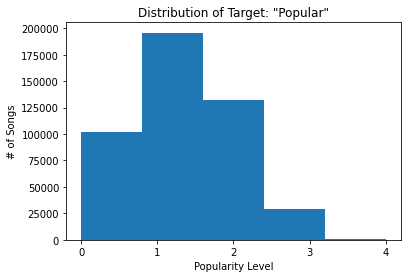

In [71]:
# # Look at the distribution of the target
# class_dist = df['popular']
# print(class_dist.value_counts())
# plt.hist(class_dist, bins=5)
# plt.xticks((0, 1, 2, 3, 4))
# plt.xlabel('Popularity Level')
# plt.ylabel('# of Songs')
# plt.title('Distribution of Target: "Popular"')
# plt.show()

In [38]:
# Get a view of the cardinality of features
df.nunique()

duration_ms         106651
id_artists           98542
energy                2403
loudness             26056
acousticness          5210
instrumentalness      5402
released_year           51
released_month          12
popular                  5
dtype: int64

### Exploratory Data Analysis

In [9]:
# # Create a Pandas Profile Report for the data
# pan_pro = ProfileReport(df)
# pan_pro

Summarize dataset:   0%|          | 0/30 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Dropped this idea, but would like to explore in the future:

**note:** in the Pandas Profile Report I noticed that the 'released_month' feature had a largely imbalanced class distribution. The proportion of the 1 class (January) acounted for over 40% of the entries. I decided to drop the column under the assumption that the default month (and also the day for that matter) of the original release date was imputed as 1 when the release date was unavailable, therefore tainting this feature.

In [42]:
# # Double check that the release months are not most 
# # prevalent during a particular range of years

# def wrangle2(file_path):
#     df = pd.read_csv(file_path,
#                     parse_dates=['release_date'])
    
#     # Split release_date into day, month, year, then drop it
#     df['released_year'] = df['release_date'].dt.year
#     df['released_month'] = df['release_date'].dt.month
#     df.drop(columns=['release_date'], inplace=True)
    
#     # Make new buckets for prediction
#     df['popular'] = [0 if r<19 else 1 if r<39 else 2 if r<59 else 3 if r<79 else 4 for r in df['popularity']]
#     df.drop(columns='popularity', inplace=True)
    
#     # Drop columns I suspect do not imfluence the target, or are redundant
#     df.drop(columns=['id', 'name', 'artists'], inplace=True)
    
#     # Limit the data set to the past 50 years
#     df = df[df['released_year'] >= 1971]
    
#     # Drop columns that were determined to have least importance
#     # in my permutation importances below
#     df.drop(columns=['key', 'time_signature', 'mode', 'tempo',
#                      'valence', 'liveness', 'speechiness',
#                      'danceability', 'explicit'],
#                     inplace=True)
    
#     return df

# df2 = wrangle2('data/tracks.csv')

In [43]:
# df_jan = df2[df2['released_month'] == 1]

In [44]:
# ProfileReport(df_jan)

Summarize dataset:   0%|          | 0/23 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [188]:
# # Engineer a 'song_age' feature in days
# # ob_date = pd.to_datetime(1587400000000000000, yearfirst=True)
# ob_date = pd.to_datetime(21420, format='%y%m%d', yearfirst=True)
# print(ob_date)
# print(ob_date - df['release_date'].iloc[0])
# df['song_age'] = ob_date - df['release_date']
# df['song_age_'] = df['song_age'].astype(str).str.strip(' days').astype('int64')
# print(df['song_age'].head)
# df['song_age_'].head()

<bound method NDFrame.head of 39501    4817 days
39511     403 days
39517    4817 days
39521    4817 days
39529    1082 days
            ...   
586667    206 days
586668    181 days
586669    230 days
586670     46 days
586671   2120 days
Name: song_age, Length: 459751, dtype: timedelta64[ns]>


39501    4817
39511     403
39517    4817
39521    4817
39529    1082
Name: song_age_, dtype: int64

In [194]:
df.head()

,duration_ms,id_artists,energy,loudness,acousticness,instrumentalness,song_age,popular
39501,160187,['3UmBeGyNwr4iDWi1vTxWi8'],0.265,-11.101,0.394,0.000000,4817,2
39511,159560,['6lH5PpuiMa5SpfjoIOlwCS'],0.867,-2.706,0.436,0.000000,403,2
39517,141987,['3UmBeGyNwr4iDWi1vTxWi8'],0.365,-10.226,0.255,0.000005,4817,2
39521,157093,['3UmBeGyNwr4iDWi1vTxWi8'],0.352,-14.165,0.406,0.000000,4817,1
39529,187333,['1Mxqyy3pSjf8kZZL4QVxS0'],0.201,-17.796,0.887,0.000000,1082,1


## Split Data

In [10]:
# Establish the target and split the data accordingly
target = 'popular'
X_ = df.drop(columns=target)
y_ = df[target]

In [11]:
# Split the data into training and testing sets
X, X_test, y, y_test = train_test_split(X_, y_, train_size=0.8, random_state=73)

# Further split training set into training and 
# validation for initial model
X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.8, random_state=37)

## Establish a Baseline

In [7]:
baseline = y_train.value_counts(normalize=True).max()
print(f'Baseline: {baseline}')

Baseline: 0.42582245785753126


## Build Models

### Random Forest (bagging model)

In [12]:
# Make a model using a random forest
model_rf = make_pipeline(
            OrdinalEncoder(),
            StandardScaler(),
            RandomForestClassifier(random_state=37, n_jobs=-2))

# Fit the random forest model
model_rf.fit(X_train, y_train)

Pipeline(steps=[('ordinalencoder', OrdinalEncoder(cols=[], mapping=[])),
                ('standardscaler', StandardScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(n_jobs=-2, random_state=37))])

### XGBoost (boosting model)

(bumped up number of estimators from previous versions and yielded higher scores)

In [13]:
# Make a boosted model
model_xgb = make_pipeline(
    OrdinalEncoder(),
    StandardScaler(),
    XGBClassifier(n_estimators=50, random_state=73, n_jobs=-2)
)

# Fit the boosted model
model_xgb.fit(X_train, y_train)

[21:02:48] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


Pipeline(steps=[('ordinalencoder', OrdinalEncoder(cols=[], mapping=[])),
                ('standardscaler', StandardScaler()),
                ('xgbclassifier',
                 XGBClassifier(base_score=0.5, booster='gbtree',
                               colsample_bylevel=1, colsample_bynode=1,
                               colsample_bytree=1, gamma=0, gpu_id=-1,
                               importance_type='gain',
                               interaction_constraints='',
                               learning_rate=0.300000012, max_delta_step=0,
                               max_depth=6, min_child_weight=1, missing=nan,
                               monotone_constraints='()', n_estimators=50,
                               n_jobs=-2, num_parallel_tree=1,
                               objective='multi:softprob', random_state=73,
                               reg_alpha=0, reg_lambda=1, scale_pos_weight=None,
                               subsample=1, tree_method='exact',
    

### Logistis Regression (Linear Model)

In [14]:
# Make a logistic regression model, be sure to
# substitue the ordinal encoder for a one hot
model_logr = make_pipeline(
    OneHotEncoder(use_cat_names=True),
    StandardScaler(),
    LogisticRegression(solver='saga')
)

# Fit the boosted model
model_logr.fit(X_train, y_train)

Pipeline(steps=[('onehotencoder', OneHotEncoder(cols=[], use_cat_names=True)),
                ('standardscaler', StandardScaler()),
                ('logisticregression', LogisticRegression(solver='saga'))])

## Check Metrics

In [15]:
# Accuracy scores for random forest model
print(accuracy_score(y_train, model_rf.predict(X_train)))
print(accuracy_score(y_val, model_rf.predict(X_val)))

0.9958265361609571
0.5448885263730289


In [16]:
# Accuracy scores for gradient boost model
print(accuracy_score(y_train, model_xgb.predict(X_train)))
print(accuracy_score(y_val, model_xgb.predict(X_val)))

0.5574598966829799
0.5393012506797172


In [17]:
# Accuracy scores for logistic regression model
print(accuracy_score(y_train, model_logr.predict(X_train)))
print(accuracy_score(y_val, model_logr.predict(X_val)))

0.4826298259923872
0.48262642740619904


In [44]:
#  Classification report for random forest validation performance
print(classification_report(y_val, model_rf.predict(X_val)))

              precision    recall  f1-score   support

           0       0.61      0.35      0.45     16207
           1       0.55      0.74      0.63     31475
           2       0.52      0.49      0.50     20996
           3       0.48      0.16      0.24      4679
           4       0.19      0.03      0.05       203

    accuracy                           0.54     73560
   macro avg       0.47      0.35      0.37     73560
weighted avg       0.55      0.54      0.53     73560



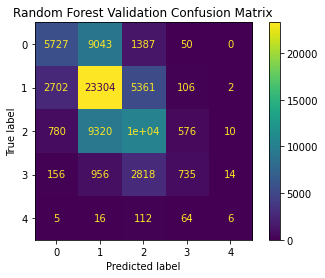

In [39]:
# Confusion Matrix for random forest base model
rf_val_cmatrix = plot_confusion_matrix(model_rf, X_val, y_val,)
plt.title('Random Forest Validation Confusion Matrix')
rf_val_cmatrix;

In [42]:
#  Classification report for gradient boost validation performance
print(classification_report(y_val, model_xgb.predict(X_val)))

              precision    recall  f1-score   support

           0       0.63      0.31      0.41     16207
           1       0.54      0.76      0.63     31475
           2       0.51      0.48      0.50     20996
           3       0.49      0.11      0.18      4679
           4       1.00      0.00      0.01       203

    accuracy                           0.54     73560
   macro avg       0.63      0.33      0.35     73560
weighted avg       0.55      0.54      0.51     73560



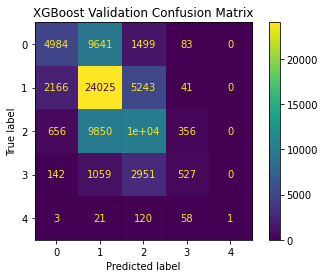

In [40]:
# Confusion Matrix for gradient boost base model
xgb_val_cmatrix = plot_confusion_matrix(model_xgb, X_val, y_val,)
plt.title('XGBoost Validation Confusion Matrix')
xgb_val_cmatrix;

In [18]:
#  Classification report for logistic regression validation performance
print(classification_report(y_val, model_logr.predict(X_val)))

              precision    recall  f1-score   support

           0       0.32      0.06      0.10     16207
           1       0.52      0.75      0.61     31475
           2       0.44      0.52      0.48     20996
           3       0.40      0.01      0.01      4679
           4       0.00      0.00      0.00       203

    accuracy                           0.48     73560
   macro avg       0.33      0.27      0.24     73560
weighted avg       0.44      0.48      0.42     73560



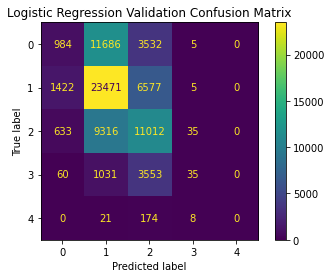

In [41]:
# Confusion Matrix for logistic regression base model
logr_val_cmatrix = plot_confusion_matrix(model_logr, X_val, y_val,)
plt.title('Logistic Regression Validation Confusion Matrix')
logr_val_cmatrix;

In [45]:
# Display these results in a data frame
val_scores = {'F1-score':[0.53, 0.51, 0.42],
              'train_acc':[0.9958, 0.5575, 0.4826],
             'val_acc':[0.5449, 0.5393, 0.4826]
             }
val_score_comparison = pd.DataFrame(data=val_scores, index=['bagging', 'boosting', 'linear'])
display(val_score_comparison)

,F1-score,train_acc,val_acc
bagging,0.53,0.9958,0.5449
boosting,0.51,0.5575,0.5393
linear,0.42,0.4826,0.4826


## Tune Model

### Permutation Importances

In [20]:
# Calculate permutation importances
perm_imp = permutation_importance(
    model_xgb,
    X_val,
    y_val,
    n_repeats=8,
    n_jobs=-2,
    random_state=41)

### Permutation Importances (after eliminating id
### and returning previously trimmed features)

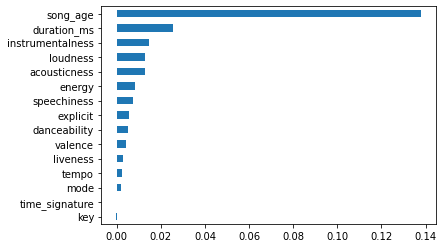

In [21]:
# Plot the permutation importances

# Create a data frame of the importances and feature names
data = {'imp_mean': perm_imp['importances_mean'],
        'imp_std': perm_imp['importances_std']}
imp_df = pd.DataFrame(data, index=X_val.columns).sort_values('imp_mean')

# Plot a bar chart
imp_df['imp_mean'].plot(kind='barh');

### Hyper parameter tuning

In [22]:
# Do a randomized search to start the tuning process

# Setup empty results list
search_hist = []
best_searches = []

# Recall the pipeline(s)
model_xgb_ = make_pipeline(
    OrdinalEncoder(),
    StandardScaler(),
    XGBClassifier(random_state=73)
)

In [49]:
# Use random search CV

# Set a dictionary of the parameters to test
params = {
    'xgbclassifier__max_depth': np.arange(14, 40, 2),
    'xgbclassifier__n_estimators': np.arange(30, 160, 10),
    'xgbclassifier__learning_rate': np.arange(0.01, 0.11, 0.01),
    'xgbclassifier__gamma': np.arange(0.0, 1.1, 0.1),
    'xgbclassifier__reg_alpha': np.arange(0.0, 1.1, 0.1),
}

# Instatiate a RandomizedSearchCV model 
model_rs = RandomizedSearchCV(model_xgb_, params, n_iter=5, n_jobs=-4, verbose=3)

# Store some results to choose from and then run through the model at the top
model_rs.fit(X, y)
search_hist.append((model_rs.best_params_, model_rs.cv_results_))
best_searches.append((model_rs.best_params_, model_rs.best_score_))

# Compare results
print(model_rs.best_params_, model_rs.best_score_)
best_searches

Fitting 5 folds for each of 5 candidates, totalling 25 fits
[03:57:34] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'xgbclassifier__reg_alpha': 1.0, 'xgbclassifier__n_estimators': 150, 'xgbclassifier__max_depth': 30, 'xgbclassifier__learning_rate': 0.09, 'xgbclassifier__gamma': 0.8} 0.5510467645459489


[({'xgbclassifier__reg_alpha': 0.8,
   'xgbclassifier__n_estimators': 80,
   'xgbclassifier__max_depth': 18,
   'xgbclassifier__learning_rate': 0.06999999999999999,
   'xgbclassifier__gamma': 1.0},
  0.5513431212615552),
 ({'xgbclassifier__reg_alpha': 1.0,
   'xgbclassifier__n_estimators': 150,
   'xgbclassifier__max_depth': 30,
   'xgbclassifier__learning_rate': 0.09,
   'xgbclassifier__gamma': 0.8},
  0.5510467645459489)]

In [72]:
# Save the trained machine learning algorithm
filename = 'spot_pop_xgb.sav'
joblib.dump(model_rs, filename)

['spot_pop_xgb.sav']

**note** Only two entries are now included because I eliminated previous results
on prior notebook versions. Also because the above performed almost
equally well, I simply used the last fit.

### Permutation Importances on Tuned Model

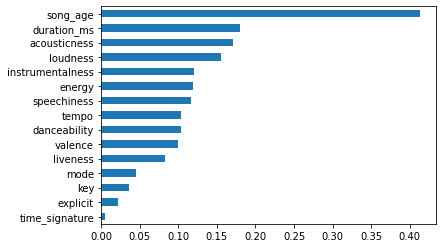

In [26]:
# Calculate permutation importances
perm_imp = permutation_importance(
    model_rs,
    X_val,
    y_val,
    n_repeats=8,
    n_jobs=-2,
    random_state=41)

# Plot the permutation importances

# Create a data frame of the importances and feature names
data = {'imp_mean': perm_imp['importances_mean'],
        'imp_std': perm_imp['importances_std']}
imp_df = pd.DataFrame(data, index=X_val.columns).sort_values('imp_mean')

# Plot a bar chart
imp_df['imp_mean'].plot(kind='barh');

## Communicate Results

At first I didn't realize that for a classification problem the pd plot would look this way, but it makes sense that it's representing the relationship in each class.

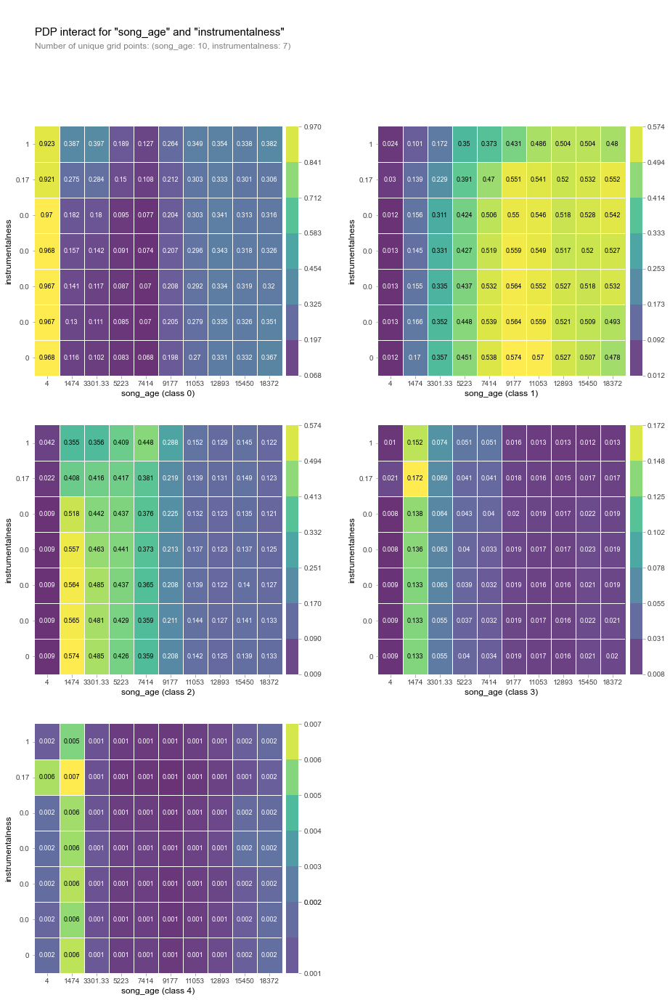

In [68]:
# Make a partial dependecy plot for the top 2 features

# Store the features in an appropriate variable
features = ['song_age', 'instrumentalness']
# Instantiate pdp_interact
interact = pdp_interact(
    model_rs,
    dataset=X_val,
    model_features=X_val.columns,
    features=features
)

# Plot
pdp_interact_plot(interact, plot_type='grid', feature_names=features);

In [55]:
# Make a Shaply force plot

# Make a basic model similar to the model_rs above
# (no pipeline)
model_xgb_best = XGBClassifier(reg_alpha=0.8,
                               n_estimators=80,
                               max_depth=18,
                               learning_rate=0.07,
                               gamma=1.0,
                               random_state=73,
                               n_jobs=-2)

model_xgb_best.fit(X,y)

[08:35:02] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=1.0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.07, max_delta_step=0, max_depth=18,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=80, n_jobs=-2, num_parallel_tree=1,
              objective='multi:softprob', random_state=73, reg_alpha=0.8,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)

In [67]:
# Select an observation
row = X_val.head(1)

explainer = shap.TreeExplainer(model_xgb_best)
shap_values = explainer.shap_values(row)

# plot
shap.initjs()
shap.force_plot(
    base_value=explainer.expected_value[0],
    shap_values=shap_values[0],
    features=row
)

### Results on test set

In [50]:
# Get F1-scores for test
print(classification_report(y_test, model_logr.predict(X_test)))
print(classification_report(y_test, model_rf.predict(X_test)))
print(classification_report(y_test, model_xgb.predict(X_test)))
print(classification_report(y_test, model_rs.predict(X_test)))

              precision    recall  f1-score   support

           0       0.33      0.06      0.11     20263
           1       0.51      0.75      0.61     39046
           2       0.45      0.52      0.48     26450
           3       0.47      0.01      0.02      5958
           4       0.00      0.00      0.00       234

    accuracy                           0.48     91951
   macro avg       0.35      0.27      0.24     91951
weighted avg       0.45      0.48      0.42     91951

              precision    recall  f1-score   support

           0       0.62      0.35      0.45     20263
           1       0.54      0.74      0.63     39046
           2       0.51      0.48      0.50     26450
           3       0.49      0.15      0.23      5958
           4       0.21      0.04      0.07       234

    accuracy                           0.54     91951
   macro avg       0.47      0.36      0.38     91951
weighted avg       0.55      0.54      0.52     91951

              precisio

In [52]:
# Display these results in a data frame
test_scores = {'F1-score val':[0.42, 0.53, 0.51, 0],
              'F1-score test':[0.42, 0.52, 0.51, 0.54]}
test_score_comparison = pd.DataFrame(data=test_scores, index=['linear', 'bagging', 'boosting', 'boosting tuned'])
display(test_score_comparison)

,F1-score val,F1-score test
linear,0.42,0.42
bagging,0.53,0.52
boosting,0.51,0.51
boosting tuned,0.00,0.54


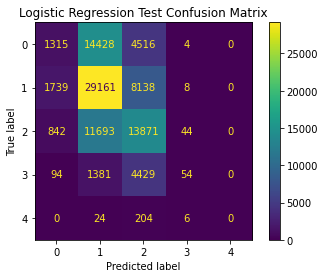

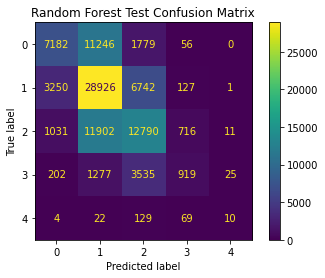

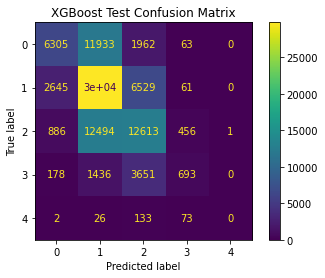

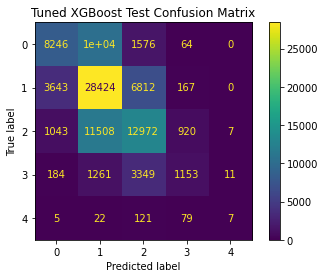

In [70]:
# Plot Confusion Matrices

# Confusion Matrix for logistic regression base model
lr_test_cmatrix = plot_confusion_matrix(model_logr, X_test, y_test,)
plt.title('Logistic Regression Test Confusion Matrix')
# Confusion Matrix for random forest base model
rf_test_cmatrix = plot_confusion_matrix(model_rf, X_test, y_test,)
plt.title('Random Forest Test Confusion Matrix')
rf_test_cmatrix;
# Confusion Matrix for gradient boost base model
xgb_test_cmatrix = plot_confusion_matrix(model_xgb, X_test, y_test,)
plt.title('XGBoost Test Confusion Matrix')
xgb_test_cmatrix;
# Confusion Matrix for tuned gradient boost base model
rs_test_cmatrix = plot_confusion_matrix(model_rs, X_test, y_test,)
plt.title('Tuned XGBoost Test Confusion Matrix')
rs_test_cmatrix;